<font size="6"><b>Requirement</b></font>

<font size="4">A large company that sells smart home appliences looking for an analytic solution that helps to minimize customer churn(customer who wants to end the subscription/ customers with non-revenue generating).

They have identified five different winback offers that they target for churn customers.
 
Hence, based on past behaviour of the customer, we are building a data science model that predicts the best offer to winback customer.</font>



<font size="6"><b>Data Source</b></font>

<font size="4">Here we use CSV file as our data source.</font>

In [1]:
import pandas as pd

<font size="4">'pandas' package is used to handle dataframes.

Read the CSV file.</font>

In [2]:
data_for_model = pd.read_csv('data_for_model_new.csv')

/home/umeshp/python_project_dir/py_env/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3051: DtypeWarning: Columns (108,136,138) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [3]:
data_for_model.shape

(35008, 154)

In [4]:
data_for_model.head(10)

,Unnamed: 0,COUNTRY,STATUS,PACKAGE_GROUP,NUMBER_OF_ACTIVE_HOLDS,SECURITY_PANEL_TYPE,RECURRING_MONTHLY_REVENUE_RMR,DEFAULT_PAYMENT_METHOD,TYPE,PREVIOUS_SERVICE_TYPE,...,ACCOUNT_SETTINGS_LT_CATEGORY,PAYMENTS_REGULAR_LT_CATEGORY,BILLING_GENERAL_LT_CATEGORY,BILLING_GENERAL_90D_CATEGORY,COUNT_90D_CATEGORY,COUNT_1Y_CATEGORY,COUNT_LT_CATEGORY,MAX_CREDIT_SCORE_RANGE_PASS_UPDATE,MIN_CREDIT_SCORE_RANGE_PASS_UPDATE,WINBACK_OFFER_TYPE
0,0,Singapore,Active,Other,0,SkyControl,64.99,ACH,Security,None,...,5,0,1,0,1,5,999,660,660,other
1,1,Singapore,Active,None,0,SkyControl,34.99,ACH,Security,None,...,1,0,5,1,5,5,999,620,620,other
2,2,Singapore,Active,Smart Home Video Upgrade,0,Smart Hub,69.99,CreditCard,Security,None,...,0,0,0,0,0,1,5,660,660,Equipment
3,3,Singapore,Active,Smart Home Video Upgrade,0,SkyControl,49.99,Other,Security,None,...,10,1,5,5,5,999,999,660,660,Subscription
4,4,Singapore,Active,Smart Home Video Upgrade,0,SkyControl,39.99,ACH,Security,None,...,5,0,1,0,1,5,999,660,660,Subscription
5,5,Singapore,Active,Smart Security Upgrade,0,SkyControl,34.99,ACH,Security,None,...,0,0,1,0,1,1,999,660,660,Subscription
6,6,Singapore,Active,Smart Home Video Upgrade,0,SkyControl,44.99,CreditCard,Security,Move,...,5,0,5,0,5,10,999,Non,Non,other
7,7,Singapore,Active,Smart Security Upgrade,0,SkyControl,59.99,CreditCard,Security,None,...,5,0,5,0,0,5,999,660,660,Subscription
8,8,Singapore,Active,Smart Home Video Upgrade,0,SkyControl,39.99,CreditCard,Security,None,...,0,0,1,0,1,5,10,660,660,Subscription
9,9,Hong Kong,Active,None,0,SkyControl,44.99,CreditCard,Security,None,...,0,0,1,0,0,5,10,640,640,other


<font size="4">The traget variable should be identified.</font>

In [5]:
target = 'WINBACK_OFFER_TYPE'

In [6]:
data_for_model[target].value_counts()

Subscription    12965
Free vies        6942
Equipment        6507
other            5605
Discounted       2989
Name: WINBACK_OFFER_TYPE, dtype: int64

<font size="6"><b>Model Building</b></font>

<font size="4"><b>Exploratory Data Analysis</b></font>

<font size="4">
    
<ul>
<li>Total counts for each and every attribute has to be recorded with the missing counts.</li>
<li>Missing counts for each and every attribute has to be examined.</li>
<li>Method of handling missing counts (Data imputation) has to be derived.
    <ul>
        <li>The frequent data imputation techniques such as ignore missing values.</li>
        <li>Replace the missing value with zero or some other number.</li>
        <li>Replace the missing value with the mean value.</li>
    </ul>
    </li>
</ul>

<ul>
<li>Univariate analysis</li>
<li>Bivariate analysis</li>
<li>Dependency analysis</li>
        <li>Correlation analysis</li>
        <li>Multivariate analysis</li>
        <li>Trend analysis</li>
</ul>

</font>

In [7]:
from pandas_profiling import ProfileReport

<font size="4">'pandas_profiling' package is used to generate the profiling report of data.</font>

In [8]:
profile = ProfileReport(data_for_model, title='Data Profiling Report', html={'style':{'full_width':True}})
profile.to_notebook_iframe()

<font size="4"><b>Feature Engineering</b></font>

<font size="4">What is feature engineering?
<ul>
<li>Identify the most influential variables through principal component analysis, singular value decomposition etc.</li>
<li>Micro-level segmentation based on the target variable.</li>
<li>Identification of the importance of attributes for the target variable.</li>
</ul>
</font>

In [9]:
all_var =  [
       'RECURRING_MONTHLY_REVENUE_RMR',
       'PACKAGE_GROUP', 
       'PANELTYPE',
       'TENURE',
        'DEFAULT_PAYMENT_METHOD',
        'SECURITY_PANEL_TYPE',
        'MAX_CREDIT_SCORE_RANGE_PASS_UPDATE',
        'DAYSSINCEORIGINALCONTRACTEXPIRATION',
        'TOTALRMR',
        'REMAININGORIGINALTERM',target]

In [10]:
predictors = [
       'RECURRING_MONTHLY_REVENUE_RMR',
       'PACKAGE_GROUP', 
       'PANELTYPE',
       'TENURE',
        'DEFAULT_PAYMENT_METHOD',
        'SECURITY_PANEL_TYPE',
        'MAX_CREDIT_SCORE_RANGE_PASS_UPDATE',
        'DAYSSINCEORIGINALCONTRACTEXPIRATION',
        'TOTALRMR',
        'REMAININGORIGINALTERM']

In [11]:
filltered_data = data_for_model[all_var]

<font size="4"><b>Model Building</b></font>

<font size="4">
<ul>
<li>The algorithm have to be decided.</li>
<li>The accuracy metrics have to be decided.</li>
</ul>
</font>

<font size="4"><b>Prepping Data for Model Building</b></font>



<font size="4">Encoding categorical variables
    
Advantages of encoding data
<ul>
<li>Since encoding removes redundancies from data, the size of your files will be a lot smaller.</li>
<li>This results in faster input speed when data is saved and model training.</li>
<li>Save space on your storage devices.</li>
</ul>

This is ideal if you have large amounts of data that need to be archived
</font>



In [14]:
import numpy as np

In [15]:
def encode_cat_variable(df):
    for col in df.dtypes[df.dtypes == "object"].index:
        lable = list(df[col].unique())
        for i in np.arange((len(pd.DataFrame(df[col].value_counts())))):
            df[col] = df[col].replace(lable[i],i)
    return df

In [16]:
encoded_data = encode_cat_variable(filltered_data)

In [17]:
encoded_data.head(10)

,RECURRING_MONTHLY_REVENUE_RMR,PACKAGE_GROUP,PANELTYPE,TENURE,DEFAULT_PAYMENT_METHOD,SECURITY_PANEL_TYPE,MAX_CREDIT_SCORE_RANGE_PASS_UPDATE,DAYSSINCEORIGINALCONTRACTEXPIRATION,TOTALRMR,REMAININGORIGINALTERM,WINBACK_OFFER_TYPE
0,64.99,0,0,1395,0,0,0,0,64.99,2,0
1,34.99,1,0,1373,0,0,1,67,59.99,-3,0
2,69.99,2,0,1381,1,1,0,97,63.99,-4,1
3,49.99,2,0,1437,2,0,0,0,49.99,0,2
4,39.99,2,0,1433,0,0,0,0,64.99,1,2
5,34.99,3,0,1382,0,0,0,92,49.99,-3,2
6,44.99,2,1,2632,1,0,2,1346,53.49,-45,0
7,59.99,3,0,1448,1,0,0,0,59.99,0,2
8,39.99,2,0,1390,1,0,0,94,59.99,-4,2
9,44.99,1,0,1380,1,0,3,96,59.99,-4,0


<font size="4">Drop rows which consist missing values</font>

In [18]:
final_data = encoded_data.dropna()

<font size="4">Seperate the data into X and Y</font>

In [19]:
x= final_data[predictors]
y= final_data[target]

In [20]:
x.shape, y.shape

((35008, 10), (35008,))

<font size="4">Split the dataset into a train and test set using the <b>train_test_split()</b> function from the scikit-learn library

The size of the split can depend on the size of the dataset, although it is common to use <b>67%</b> of the data for training and the remaining <b>33%</b> for testing.
</font>

In [21]:
from sklearn.model_selection import train_test_split

In [22]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.33, random_state=42)
pd.DataFrame(x_train).shape, pd.DataFrame(y_train).shape, x_test.shape, y_test.shape

((23455, 10), (23455, 1), (11553, 10), (11553,))

<font size="4">Convert training and test set into data matrix</font>

In [24]:
import xgboost as xgb

In [25]:
dtrain = xgb.DMatrix(data=x_train, label=y_train)

dtest = xgb.DMatrix(data=x_test)

<font size="4">XGBoost Model Parameters
<ul>
    <li><b>General parameters: </b>Which relate to which booster we are using to do boosting, commonly tree or linear mode.</li>
    <li><b>Booster parameters: </b>Booster parameters depend on which booster you have chosen.</li>
<li><b>Learning task parameters: </b>Which decide on the learning scenario. For example, regression tasks may use different parameters with ranking tasks.</li>
    <li><b>Command line parameters: </b>Which relate to behavior of CLI version of XGBoost.</li>
</ul>
    
XGBoost parameters definition: https://xgboost.readthedocs.io/en/latest/parameter.html     
</font>


<font size="4">
<b>eta</b> [default=0.3, alias: <b>learning_rate</b>]

Step size shrinkage used in update to prevents overfitting. After each boosting step, we can directly get the weights of new features, and eta shrinks the feature weights to make the boosting process more conservative.

range: [0,1]

<b>colsample_bytree</b> [default=1]
    
The subsample ratio of columns when constructing each tree. Subsampling occurs once for every tree constructed.

range: (0,1]

<b> max_depth</b> [default=6]
    
Maximum depth of a tree. Increasing this value will make the model more complex and more likely to overfit. 0 is only accepted in lossguided growing policy when tree_method is set as hist and it indicates no limit on depth. Beware that XGBoost aggressively consumes memory when training a deep tree.

range: [0,∞] (0 is only accepted in lossguided growing policy when tree_method is set as hist)


<b>objective</b> [default=reg:squarederror]
<ul>
<li><b>multi:softmax</b>: set XGBoost to do multiclass classification using the softmax objective, you also need to set <b>num_class</b>(number of classes)</li>

<li><b>multi:softprob</b>: same as softmax, but output a vector of <b>ndata * nclass</b>, which can be further reshaped to ndata * nclass matrix. The result contains predicted probability of each data point belonging to each class.</li>
</ul>

<b>eval_metric</b> [default according to objective]

Evaluation metrics for validation data, a default metric will be assigned according to objective (rmse for regression, and error for classification, mean average precision for ranking)
<ul>
<li><b>merror</b>: Multiclass classification error rate. It is calculated as (no. of wrong cases)/(no. of all cases).</li>

<li><b>mlogloss</b>: Multiclass logloss(Log loss penalizes false classifications by taking into account the probability of classification).</li>
</ul>    
</font>

In [26]:
params = {
    'booster': 'gbtree'
     ,'learning_rate': 0.3
    ,'max_depth': 7
    ,'colsample_bytree': 0.3
    ,'objective': 'multi:softmax'
    ,'num_class': 5
    ,'eval_metric':'merror'
}

<font size="4"><b>Model Training</b></font>

In [27]:
model_1 = xgb.train(params, dtrain)

<font size="4"><b>Generating predictions for test dataset</b></font>

In [28]:
pred = model_1.predict(dtest)

In [29]:
pred

array([2., 0., 4., ..., 2., 4., 3.], dtype=float32)

<font size="4"><b>Convert prediction and actual values to a comparable dataframe</b></font>

In [30]:
def compare_actual_prediction(y_true, y_pred, y_true_col_name):
    
    y_pred_col_name='%s_%s' % ('PREDICTED', y_true_col_name)
    
    pred_df = pd.DataFrame(y_pred)
    pred_df = pred_df.rename(columns={0: y_pred_col_name})
    pred_df[y_pred_col_name] = pred_df[y_pred_col_name].astype('int64')
    
    y_test_df = pd.DataFrame(y_test)
    y_test_df = y_test_df.reset_index()
    y_test_df = y_test_df.rename(columns={0: y_true_col_name})
    y_test_df[y_true_col_name] = y_test_df[y_true_col_name].astype('int64')
    y_test_df = y_test_df[[y_true_col_name]]
    
    pred_actual_df = pd.concat([y_test_df, pred_df], axis=1, sort=False)
    
    return pred_actual_df

In [31]:
pred_actual_df = compare_actual_prediction(y_test, pred, y_true_col_name = target)
pred_actual_df

,WINBACK_OFFER_TYPE,PREDICTED_WINBACK_OFFER_TYPE
0,2,2
1,2,0
2,4,4
3,1,3
4,4,4
...,...,...
11548,2,3
11549,3,3
11550,2,2
11551,0,4


<font size="4"><b>Model Saving and Loading</b></font>

In [32]:
import pickle

<font size="4">Save model</font>

In [33]:
file_name = "model1.pkl"

pickle.dump(model_1, open(file_name, "wb"))

<font size="4">Load model</font>

In [34]:
model1_loaded = pickle.load(open(file_name, "rb"))

<font size="6"><b>Model Evaluation</b></font>

<font size="4"><b>Model Accuracy Matrixes
</b></font>

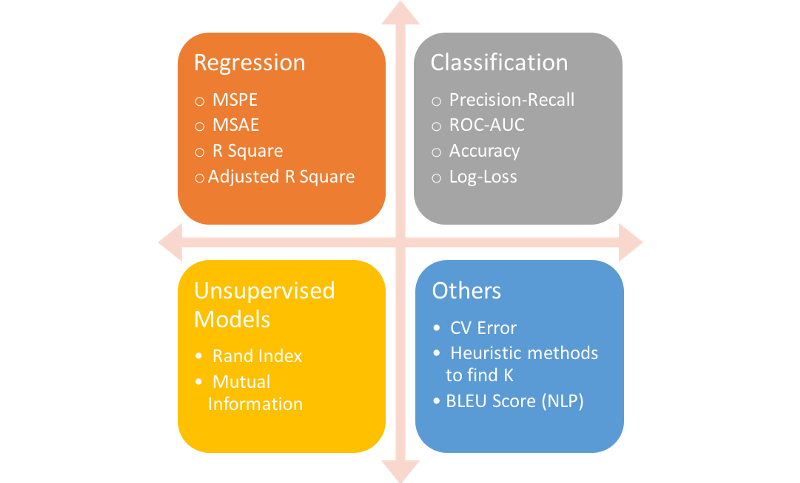

<font size="4"><b>Model Accuracy Validation Methods
</b></font>

<font size="4">Hold-Out Validation</font>
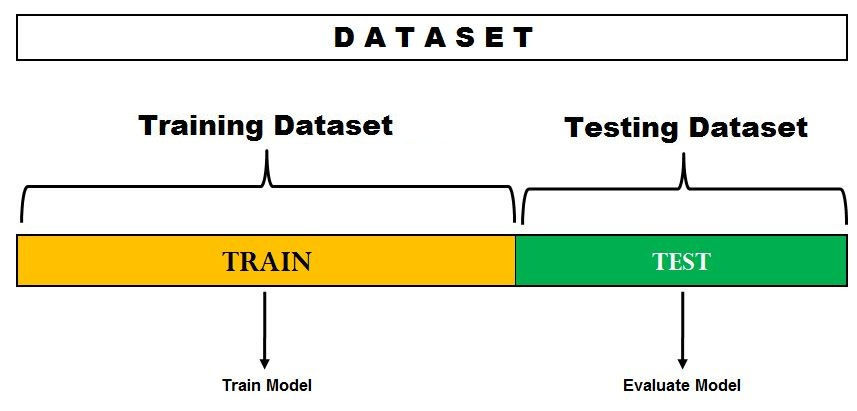

<font size="4">k-Fold Cross Validation</font>
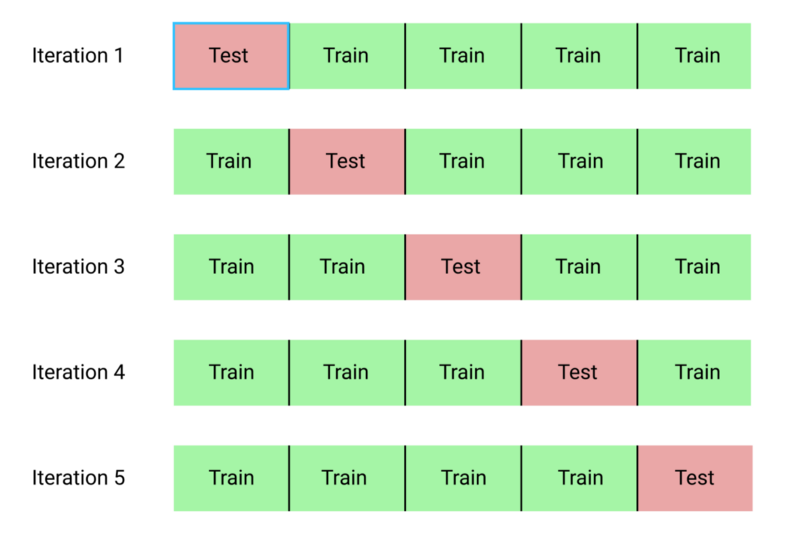

<font size="4"><b>Confusion matrix :</b>
    
A confusion matrix shows the number of correct and incorrect predictions made by the classification model compared to the actual outcomes (target value) in the data.
  
</font>

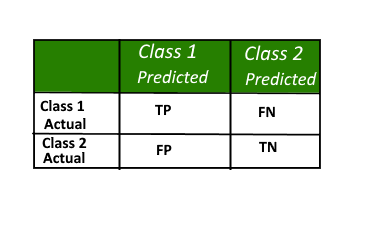

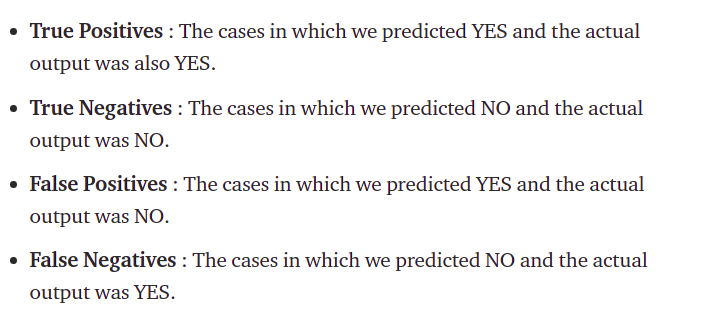

[<img src="prec_recall_new.png" width="710"/>](prec_recall_new.png)

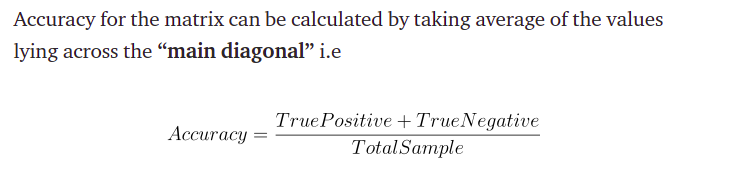

In [35]:
from sklearn.metrics import confusion_matrix

In [36]:
con_mt = confusion_matrix(y_test, pred)
con_mt

array([[ 768,  204,  636,   66,  164],
       [  88,  733,  505,  626,  188],
       [  70,  113, 3337,  683,   75],
       [  40,   91,  774, 1353,   32],
       [   8,   38,   43,    0,  918]])

In [37]:
from sklearn.metrics import classification_report

In [38]:
print(classification_report(y_test, pred))

              precision    recall  f1-score   support

           0       0.79      0.42      0.55      1838
           1       0.62      0.34      0.44      2140
           2       0.63      0.78      0.70      4278
           3       0.50      0.59      0.54      2290
           4       0.67      0.91      0.77      1007

    accuracy                           0.62     11553
   macro avg       0.64      0.61      0.60     11553
weighted avg       0.63      0.62      0.60     11553



<font size="4"><b>Evaluation Feature Importance</b></font>

In [39]:
import matplotlib.pylab as plt

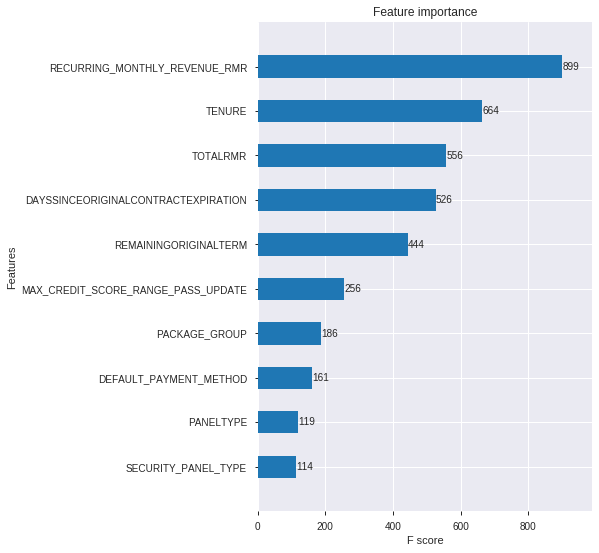

In [40]:
fig, ax = plt.subplots(figsize=(6,9))

xgb.plot_importance(model_1, max_num_features=20, height=0.5, ax=ax)

plt.show()

<font size="6"><b>Prediction Steps</b></font>

<font size="4">Read dataset for prediction</font>

In [41]:
data_new = pd.read_csv('prediction_needed_data_new.csv')

In [42]:
data_new

,Unnamed: 0,COUNTRY,STATUS,PACKAGE_GROUP,NUMBER_OF_ACTIVE_HOLDS,SECURITY_PANEL_TYPE,RECURRING_MONTHLY_REVENUE_RMR,DEFAULT_PAYMENT_METHOD,TYPE,PREVIOUS_SERVICE_TYPE,...,MISSING,ACCOUNT_SETTINGS_LT_CATEGORY,PAYMENTS_REGULAR_LT_CATEGORY,BILLING_GENERAL_LT_CATEGORY,BILLING_GENERAL_90D_CATEGORY,COUNT_90D_CATEGORY,COUNT_1Y_CATEGORY,COUNT_LT_CATEGORY,MAX_CREDIT_SCORE_RANGE_PASS_UPDATE,MIN_CREDIT_SCORE_RANGE_PASS_UPDATE
0,0,Singapore,Active,Smart Home Video Upgrade,0,Smart Hub,41.47,CreditCard,Security,Move,...,1,1,0,0,0,5,5,5,0,0
1,1,Hong Kong,Active,Smart Home Video Upgrade,0,Smart Hub,19.99,CreditCard,Security,None,...,0,10,1,5,5,999,999,999,660,660
2,2,Singapore,Active,Smart Home Video Upgrade,0,Go Control,64.49,ACH,Security,None,...,0,1,0,1,0,5,5,999,0,0
3,3,Singapore,Active,Smart Home,0,Smart Hub,49.99,CreditCard,Security,None,...,0,0,0,0,0,5,5,5,660,660
4,4,Singapore,Active,Smart Security Upgrade,1,SkyControl,38.99,Other,Security,None,...,0,1,1,10,5,5,10,999,660,660
5,5,Singapore,Active,None,2,SkyControl,34.99,ACH,Security,None,...,0,5,0,5,0,10,999,999,660,600
6,6,Singapore,Active,Smart Home Video Upgrade,0,Smart Hub,35.85,CreditCard,Security,Move,...,0,5,0,5,0,5,999,999,0,0
7,7,Singapore,Active,Smart Security Upgrade,0,SkyControl,47.47,CreditCard,Security,None,...,0,5,5,1,0,5,10,999,660,660
8,8,Singapore,Active,Smart Home Video Upgrade,0,Smart Hub,49.99,CreditCard,Security,None,...,0,5,1,5,0,10,10,999,660,660
9,9,Singapore,Active,Smart Home,0,Smart Hub,44.99,CreditCard,Security,None,...,1,0,0,0,0,10,10,10,600,600


<font size="4">Preparing dataset for prediction</font>

In [43]:
filltered_data_new = data_new[predictors]

encoded_data_new = encode_cat_variable(filltered_data_new)

final_data_new = encoded_data_new.dropna()

dnew = xgb.DMatrix(data=final_data_new)

<font size="4">Load saved model</font>

In [44]:
model= pickle.load(open(file_name, "rb"))

<font size="4">Generating Prediction for new dataset</font>

In [45]:
pred_new = model.predict(dtest)

In [46]:
pred_new 

array([2., 0., 4., ..., 2., 4., 3.], dtype=float32)